<a href="https://colab.research.google.com/github/schukinam/otus_dl/blob/master/lesson21_transfer_learning.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

## Подготовка окружения

In [0]:
%tensorflow_version 2.x

In [0]:
import tensorflow_datasets as tfds
import tensorflow.keras as keras
import numpy as np
import matplotlib.pyplot as plt
from numpy.linalg import norm
import tensorflow as tf
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
print(tf.__version__)

2.1.0


### Utils

In [0]:
def make_model(img_shape, num_classes, model=None):
  """
  Создаем модель. По умолчанию - InceptionResNetV2.
  Если передан конструктор model, используется он (должен поддерживать 
  интерфейс keras.applications).
  
  Из созданного экземпляра модели (в котором нет выходного слоя, т.е. это
  feature extractor) создается модель, которая будет обучаться.

  (Добавляется GlobalAveragePooling2D и два полносвязных слоя с дропаутом).
  """
  if model is None:
    model = keras.applications.InceptionResNetV2(include_top=False, weights='imagenet')
  else:
    model = model(include_top=False, weights='imagenet')
  for layer in model.layers:
    layer.trainable = False
  input = keras.layers.Input(img_shape)
  custom_model = model(input)
  custom_model = keras.layers.GlobalAveragePooling2D()(custom_model)
  custom_model = keras.layers.Dense(64, activation='relu')(custom_model)
  custom_model = keras.layers.Dropout(0.5)(custom_model)
  predictions = keras.layers.Dense(num_classes, activation='softmax')(custom_model)
  return keras.Model(input, predictions)


def prepare_data(data, image_shape):
  """
  Подготовка данных к формату tf.data.Dataset.
 
  data - tf.data.Dataset - обрабатывается: при помощи map применяются
  tf.image.resize до размера image_shape, а затем rescale.
  """
  def resize(x, y):
    return (tf.image.resize(x, image_shape), y)
  
  def rescale(x, y):
    return (tf.cast(x, dtype=tf.float32) / 255., y)  # cast из int во float

  return (data
          .map(resize)
          .map(rescale)
          # .cache()  # - лучше не кешировать в память в колабе.
          .shuffle(1024)  # - рандомизированный порядок загрузки изображений
          )


def make_feature_extractor(model, crop_layers):
  """
  Делаем feature_extractor из модели model, отбрасывая crop_layers слоев.
  """
  inp = model.input
  output = model.layers[-(crop_layers+1)].output
  return keras.Model(inp, output)


def extract(image, model):
  """
  Извлекает признаки из одного изображения image при помощи model. 
  Нормализует и возвращает извлеченный вектор с признаками.
  """
  image = np.expand_dims(image, axis=0)
  features = model.predict(image)
  features = features / norm(features)
  return features


def plot_neighbors(images, indicies, dist, rows, cols):
  """
  # TODO: переделать так, чтобы размер сетки считался автоматически.
  Строит график с несколькими изображениями.
  images - массив изображений.
  indicies - индексы ближайших соседей в images. 
  dist - список расстояний  # TODO: должен быть той же размерности, что и индексы
  rows - количество строк на plt.subplots.
  cols - количество столбцов на plt.subplots.
  """
  images = images[indicies]
  i = 0
  fig, axis = plt.subplots(nrows=rows, ncols=cols, figsize=(12, 12))
  for row in axis:
    for ax in row:
      ax.imshow(images[i])
      ax.set_title(f"Distance: {dist[i]}")
      i += 1
  plt.show()


# Словать с классами
CLASSES = dict(enumerate(['shark', 'whale']))


class SimilaritySearch:
  """
  Класс для поиска похожих изображений при помощи NN
  """
  def __init__(self, model):
    self.model = model  
    # Остальные атрибуты определяются во время обучения.
    self.neig = None
    self.images = None
    self.trained = False
    self._normalized_vectors = None

  def fit(self, images):
    """
    Передаем модели массив изображений images.
    Модель
    1) Создает из них векторы
    2) Нормализует векторы
    3) Обучает sklearn-класс для поиска ближайших соседей.
    4) Выставляет флаг, что обучена
    """
    self.images = images
    feature_vectors = self.model.predict(images)
    self._normalized_vectors = feature_vectors / np.expand_dims(norm(feature_vectors, axis=1), axis=-1)
    self.neig = (NearestNeighbors(n_neighbors=4,
                                  algorithm='brute',
                                  metric='euclidean').
                 fit(self.normalized_vectors))
    self.trained = True

  def find(self, vector):
    """
    Поиск изображений из массива, на котором обучалась модель,
    векторные представления которых наиболее близки к vector.
    Работает, только если модель обучена.
    """
    if not self.trained:
      raise RuntimeError("Model was not trained yet.")
    dist, indicies = self.neig.kneighbors([vector])
    plot_neighbors(self.images, indicies[0], dist[0], 2, 2)

  def __call__(self, vector):
    """
    Вызов метода find через ()
    """
    return self.find(vector)

  @property
  def normalized_vectors(self):
    return self._normalized_vectors


def make_tsne_plot_from_vectors(vectors, labels=None, figsize=(6, 4.5)):
  """
  Эта функция строит t-SNE и рисует plt.scatterplot.
  Опцилнально plt.scatterplot аннотирован метками labels.
  """
  tsne_results = TSNE(n_components=2,
                      verbose=1,
                      metric='euclidean').fit_transform(vectors) 

  cmap = plt.cm.get_cmap('coolwarm')
  plt.figure(figsize=figsize, dpi=80)
  scatter = plt.scatter(tsne_results[:, 0],
                        tsne_results[:, 1], 
                        c=labels, 
                        cmap=cmap)
  if labels is not None:
    plt.colorbar(scatter)
  plt.show()


def make_pca_then_tsne_plot(vectors, labels=None):
  """
  На основе веторов vectors сначала делаем PCA, затем tsne.
  labels - метки, используемые для аннотации plt.scatterplot.
  """
  # Следующая строчка нужна, чтобы PCA можно было выполнить, когда размерность
  # целевого пространства была задана больше, чем количество векторов.
  # Мы сокращаем ее до количества векторов.
  pca_dimension = min(100, len(vectors))  
  pca = PCA(pca_dimension)
  pca.fit(vectors)
  pca_vectors = pca.transform(vectors)
  make_tsne_plot_from_vectors(pca_vectors, labels)


def plot_pair(im_l, im_r, idx):
  """
  Печатает idx-й элемент из "первого" и "второго" массивов на
  одном плоте как пару изображений.
  """
  fig, axis = plt.subplots(nrows=1, ncols=2)
  axis[0].imshow(im_l[idx])
  axis[1].imshow(im_r[idx])
  plt.show()


def _plot_misclassified(ax, image, true_label, predicted_label):
  """
  Рисует изображение в переданном объекте ax. 
  Добавляет подписи с настоящим и спрогнозированным классом.
  """
  ax.imshow(image)
  ax.set_title(f"TRUE LABEL: {CLASSES[true_label]},\nPREDICTED: {CLASSES[predicted_label]}")


def get_subplots_grid(n_items, max_n_cols):
  """
  Рассчитывает необходимое количество строк и столбцов, 
  исходя из максимального количества столбцов и количества элементов.
  """
  if n_items % max_n_cols == 0:
    n_rows = n_items // max_n_cols
  else:
    n_rows = n_items // max_n_cols + 1
  n_cols = min(n_items, max_n_cols)
  return n_rows, n_cols


def plot_misclassified(misclassified, labels, predictions, max_n_cols = 5):
  """
  Получает список ошибочно классифицированных изображений missclassified,
  список _всех_ меток labels,
  список _всех_ лейблов predicitons.
  Эти при помощи _plot_misclassified строит subplots шириной max_n_cols.
  """
  w, h = 4, 3  # ширина и высота области для одного subplot
  n_misc = len(misclassified)
  if n_misc == 0:
    print("There's nothing to plot!")
  elif n_misc == 1:
    n_rows, n_cols = 1, 1
    fig, axis = plt.subplots(nrows=n_rows, ncols=n_cols,
                            figsize=(w * n_cols, h * n_rows))
    axis.axis('off')
    _plot_misclassified(axis,
                        misclassified[0],
                        labels[labels != predictions][0],
                        predictions[labels != predictions][0])
  else:
    n_rows, n_cols = get_subplots_grid(n_misc, max_n_cols)
    fig, axis = plt.subplots(nrows=n_rows, ncols=n_cols,
                            figsize=(w * n_cols, h * n_rows))
    for i, image in enumerate(misclassified):
      ax = axis[i] if n_rows == 1 else axis[i // n_cols, i % n_cols]
      ax.axis('off')  # отключает подписи осей
      _plot_misclassified(ax,
                          misclassified[i],
                          labels[labels != predictions][i],
                          predictions[labels != predictions][i])    
    plt.show()


def plot_feature_extraction(feature_extractor,
                            images,
                            labels,
                            n_images_to_plot=0):
  """
  Функция для исследования скрытого пространства, которое извлек 
  feature_extractor.
  feature extractor - нейросеть, возвращает вектора из n-мерного пространства
  images - набор изображений, который будет передан в нейросеть
  labels - набор меток (нужен для построения t-SNE)
  n_images_to_plot - количество изображений, для которого будут показаны 
  три ближайших соседа
  """
  # Обучение модели для поиска ближайших соседей
  search = SimilaritySearch(feature_extractor)
  search.fit(images)
  # Получение нормализованного векторного представления происходит внутри
  # SimilaritySearch таким образом:
  # feature_vectors = feature_extractor.predict(images)
  # feature_vectors / np.expand_dims(norm(feature_vectors, axis=1), axis=-1)
  normalized_vecotrs = search.normalized_vectors 

  for image_num in range(n_images_to_plot):
    search(normalized_vecotrs[image_num])

  fs_shape = normalized_vecotrs.shape[-1]
  if fs_shape > 100:  # Если размерность "большая", сначала сделаем PCA 
    make_pca_then_tsne_plot(normalized_vecotrs, labels)
  else:  # Иначе сразу делаем t-SNE
    make_tsne_plot_from_vectors(normalized_vecotrs, labels)
  return feature_extractor

## Sharks vs. Whales

### Научимся отличать акул от китов

**Для этого мы**:
* Соберем небольшой датасет при помощи fatkun chrome extension
* Загрузим его на GDrive
* Обучим модель при помощи transfer learning
* Посмотрим, что получилось

> Сначала примонтируем свой гугл диск (чтобы было куда загружать датасеты)

In [0]:
from google.colab import drive 
import os

In [0]:
drive.mount('/content/gdrive')

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


Теперь gdrive примонтирован к той вируталке, на которой запущен ваш ноутбук.

In [0]:
!ls /content/gdrive/My\ Drive/SharksVsWhales

model.h5  test	train  validation


In [0]:
dataset_path = '/content/gdrive/My Drive/SharksVsWhales'

In [0]:
os.listdir(dataset_path)

['test', 'train', 'validation', 'model.h5']

In [0]:
!apt-get install tree

Reading package lists... Done
Building dependency tree       
Reading state information... Done
tree is already the newest version (1.7.0-5).
0 upgraded, 0 newly installed, 0 to remove and 25 not upgraded.


In [0]:
!tree '/content/gdrive/My Drive/SharksVsWhales' -d 2

/content/gdrive/My Drive/SharksVsWhales
├── test
│   ├── sharks
│   └── whales
├── train
│   ├── sharks
│   └── whales
└── validation
    ├── sharks
    └── whales
2 [error opening dir]

9 directories


### Вспоминаем flow from directory

> [Туториал](https://keras.io/preprocessing/image/)

* Создадим обучающий и тестовый генераторы. Не забываем дотавить препроцессинг.
* "Запитаем" их из соответвующих директорий.

In [0]:
BATCH_SIZE = 32
IMAGE_SIZE = (299, 299)

train_datagen = keras.preprocessing.image.ImageDataGenerator(
        rescale=1./255,  # в обучающем генераторе используем аугментации
        shear_range=0.2,
        zoom_range=0.2,
        horizontal_flip=True)

# В тестовом и валидационном генераторах аугментации не нужны!
valid_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

test_datagen = keras.preprocessing.image.ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
        os.path.join(dataset_path, 'train'), 
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='binary')

valid_generator = test_datagen.flow_from_directory(
        os.path.join(dataset_path, 'validation'),
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='binary')

test_generator = test_datagen.flow_from_directory(
        os.path.join(dataset_path, 'test'),
        target_size=IMAGE_SIZE,
        batch_size=BATCH_SIZE,
        class_mode='binary')

# generator.n хранит количество предметов в генераторе.
STEPS_PER_EPOCH = train_generator.n // BATCH_SIZE
VALIDATION_STEPS = valid_generator.n // BATCH_SIZE
TEST_STEPS = test_generator.n // BATCH_SIZE

Found 1013 images belonging to 2 classes.
Found 200 images belonging to 2 classes.
Found 200 images belonging to 2 classes.


### Создадим модель

In [0]:
svw_model = make_model((299, 299, 3), 2)

In [0]:
svw_model.compile(keras.optimizers.Adam(),
                  keras.losses.SparseCategoricalCrossentropy(),
                  metrics=[keras.metrics.SparseCategoricalAccuracy()])

### Подготовим картинки для того, чтобы было проще делать демо

In [0]:
def extract_data_from_generator(generator, steps):
  images = list()
  labels = list()
  for (im, l), _ in zip(generator, range(steps)):
    images.append(im)
    labels.append(l)
  return np.concatenate(images), np.concatenate(labels)

In [0]:
images, labels = extract_data_from_generator(test_generator, TEST_STEPS)

**Посмотрим на распределение извлеченных признаков, прежде чем обучать feature extractor**

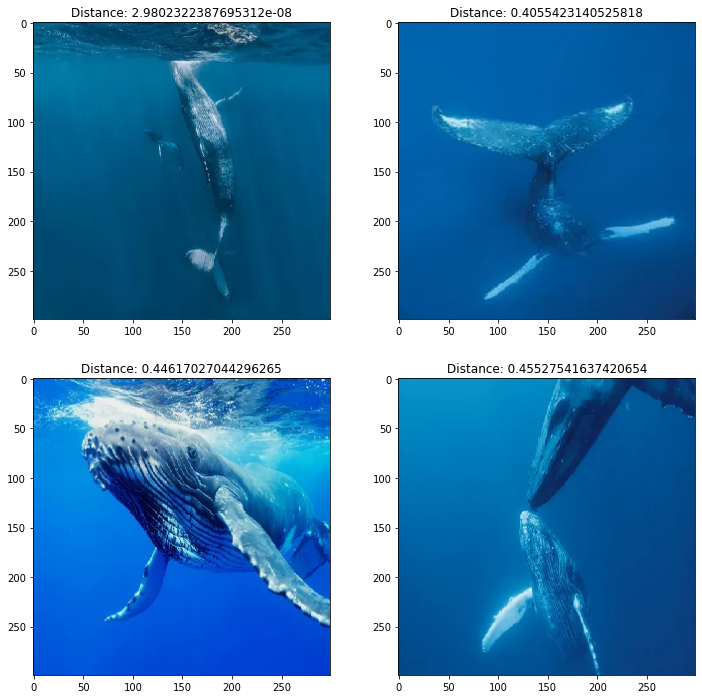

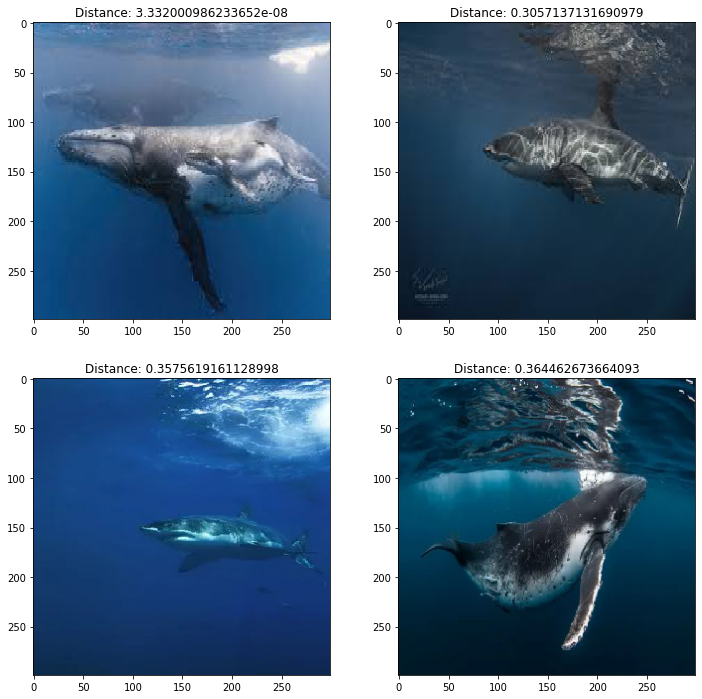

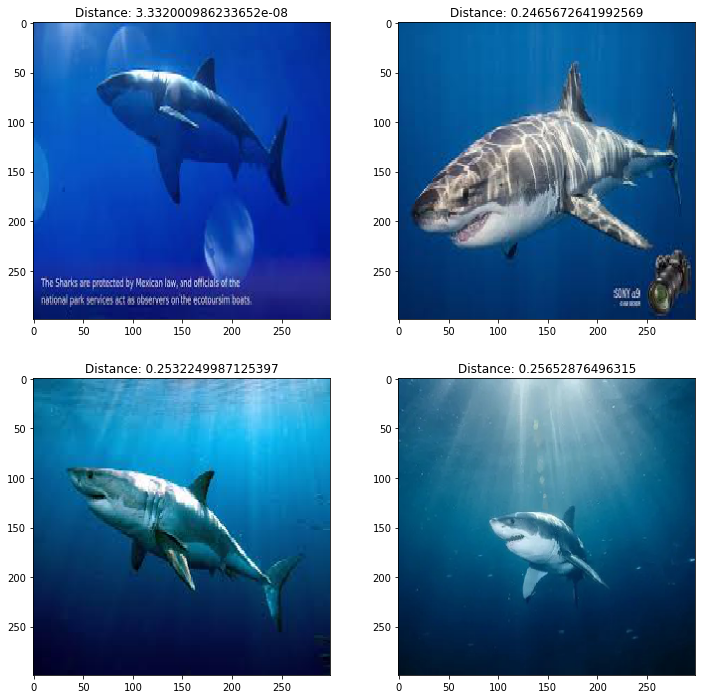

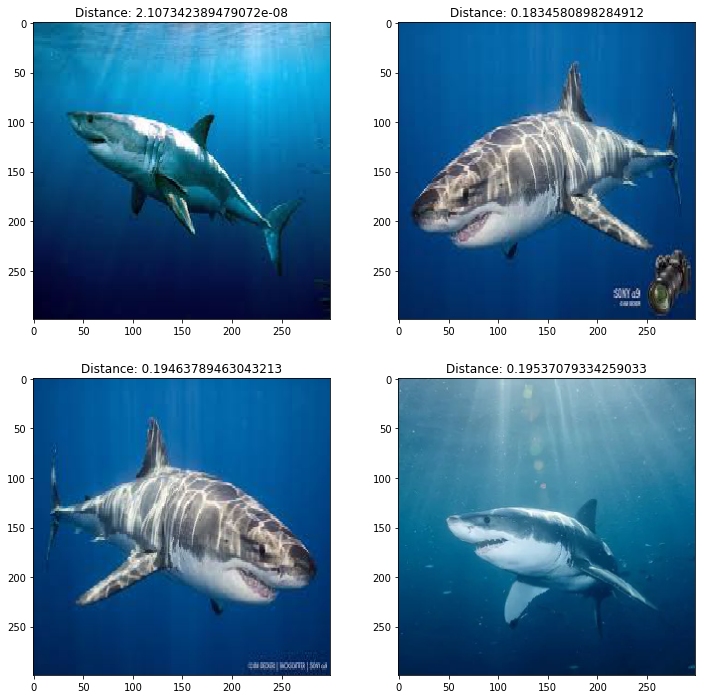

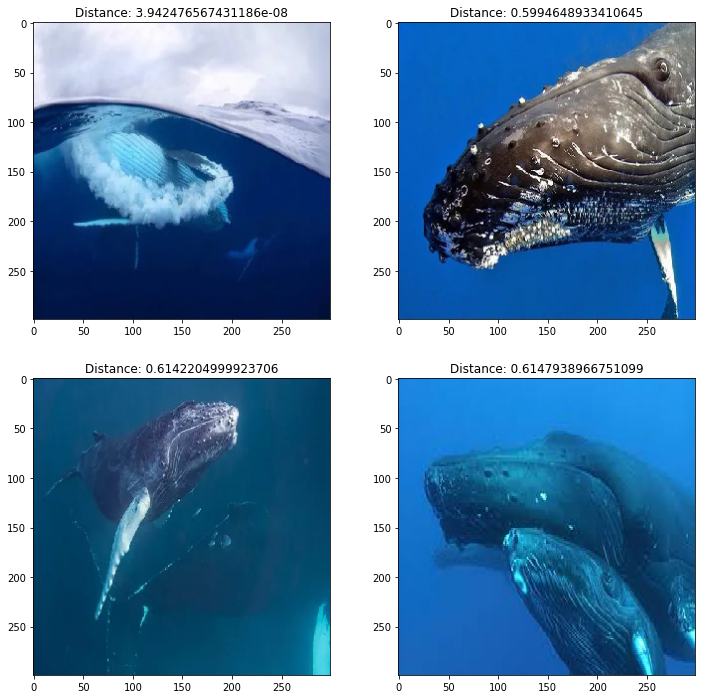

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 192 samples in 0.001s...
[t-SNE] Computed neighbors for 192 samples in 0.013s...
[t-SNE] Computed conditional probabilities for sample 192 / 192
[t-SNE] Mean sigma: 0.246881
[t-SNE] KL divergence after 250 iterations with early exaggeration: 58.636456
[t-SNE] KL divergence after 1000 iterations: 0.338000


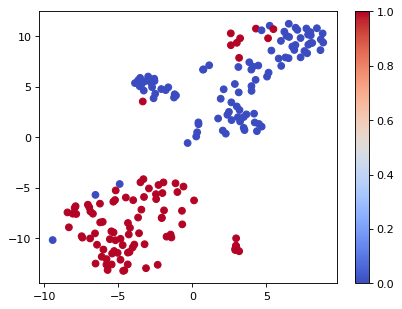

In [0]:
feature_extractor = make_feature_extractor(svw_model, 3)
plot_feature_extraction(feature_extractor,
                        images,
                        labels,
                        n_images_to_plot=5)

**Видим, что feature extractor уже хорошо справляется с разделением классов, т.к. в imagenet есть отдельные классы китов и акул.
Дообучим модель на наших данных, чтобы ещё улучшить качество**

### Обучим модель

In [0]:
monitor = 'val_sparse_categorical_accuracy'

early_stopping = keras.callbacks.EarlyStopping(monitor=monitor, 
                                               patience=5,
                                               mode='max',
                                               restore_best_weights=True)

checkpoint = keras.callbacks.ModelCheckpoint(os.path.join(dataset_path, 'model.h5'), 
                                             monitor=monitor,
                                             save_best_only=True,
                                             mode='max')

tensorboard = keras.callbacks.TensorBoard(log_dir='logs',
                                          histogram_freq=1,
                                          update_freq='epoch')

callbacks = [early_stopping,
             checkpoint,
             tensorboard
             ]

In [0]:
svw_model.summary()

Model: "model_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         [(None, 299, 299, 3)]     0         
_________________________________________________________________
inception_resnet_v2 (Model)  multiple                  54336736  
_________________________________________________________________
global_average_pooling2d (Gl (None, 1536)              0         
_________________________________________________________________
dense (Dense)                (None, 64)                98368     
_________________________________________________________________
dropout (Dropout)            (None, 64)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 2)                 130       
Total params: 54,435,234
Trainable params: 98,498
Non-trainable params: 54,336,736
__________________________________________

In [0]:
!rm -rf logs/*
!mkdir -p logs

In [0]:
keras.backend.clear_session()

In [0]:
%load_ext tensorboard
%tensorboard --logdir logs --bind_all

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


<IPython.core.display.Javascript object>

In [0]:
svw_model.fit_generator(train_generator,
                        steps_per_epoch=STEPS_PER_EPOCH,
                        epochs=50,
                        validation_data=valid_generator,
                        validation_steps=VALIDATION_STEPS,
                        callbacks=callbacks
                        )

  ...
    to  
  ['...']
  ...
    to  
  ['...']
Train for 31 steps, validate for 6 steps
Epoch 1/50
31/31 [==============================] - 59s 2s/step - loss: 0.4667 - sparse_categorical_accuracy: 0.7757 - val_loss: 0.5329 - val_sparse_categorical_accuracy: 0.7865
Epoch 2/50
31/31 [==============================] - 46s 1s/step - loss: 0.2680 - sparse_categorical_accuracy: 0.8889 - val_loss: 0.6315 - val_sparse_categorical_accuracy: 0.8125
Epoch 3/50
31/31 [==============================] - 46s 1s/step - loss: 0.2355 - sparse_categorical_accuracy: 0.9083 - val_loss: 0.6380 - val_sparse_categorical_accuracy: 0.8333
Epoch 4/50
31/31 [==============================] - 45s 1s/step - loss: 0.2300 - sparse_categorical_accuracy: 0.9103 - val_loss: 0.5942 - val_sparse_categorical_accuracy: 0.8438
Epoch 5/50
31/31 [==============================] - 42s 1s/step - loss: 0.2288 - sparse_categorical_accuracy: 0.9032 - val_loss: 0.6510 - val_sparse_categorical_accuracy: 0.8385
Epoch 6/50
31/31 [=

**Проверим качество на отложенной выборке**

In [0]:
y_pred = svw_model.predict(images)

In [0]:
m = tf.keras.metrics.SparseCategoricalAccuracy() 
_ = m.update_state(labels, y_pred) 
m.result().numpy() 

0.8385417

### Посмотрим на прогнозы последнего слоя

> Разделение стало лучше

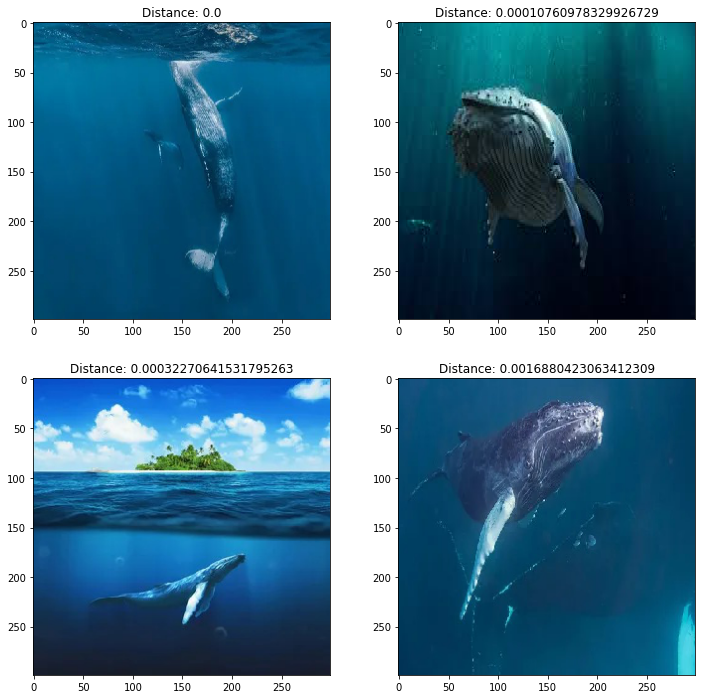

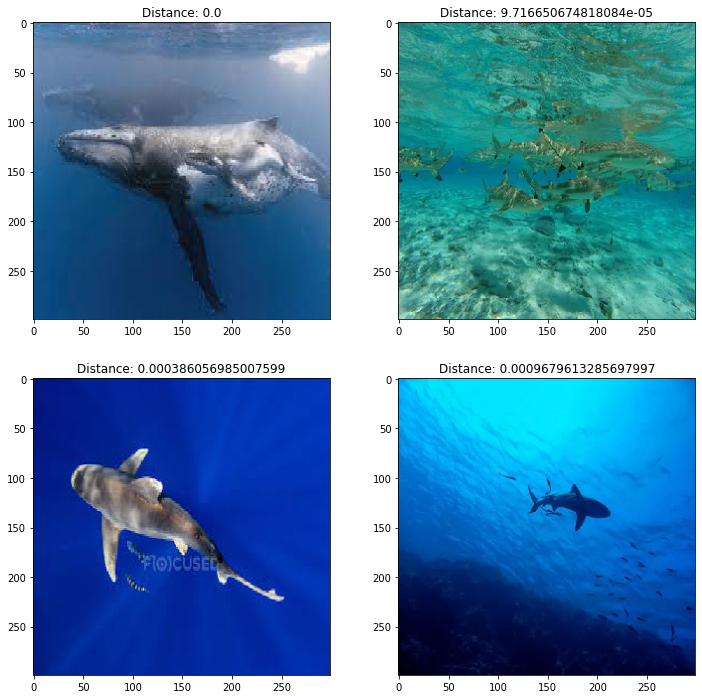

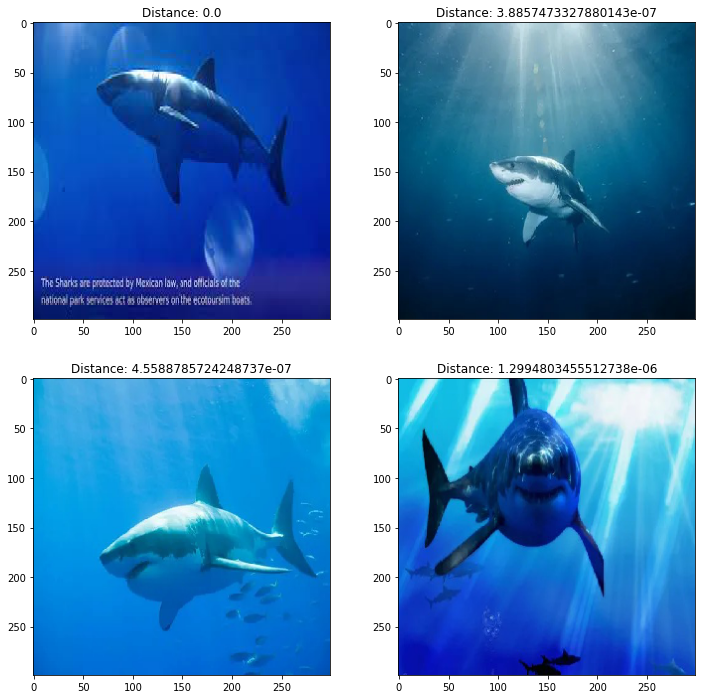

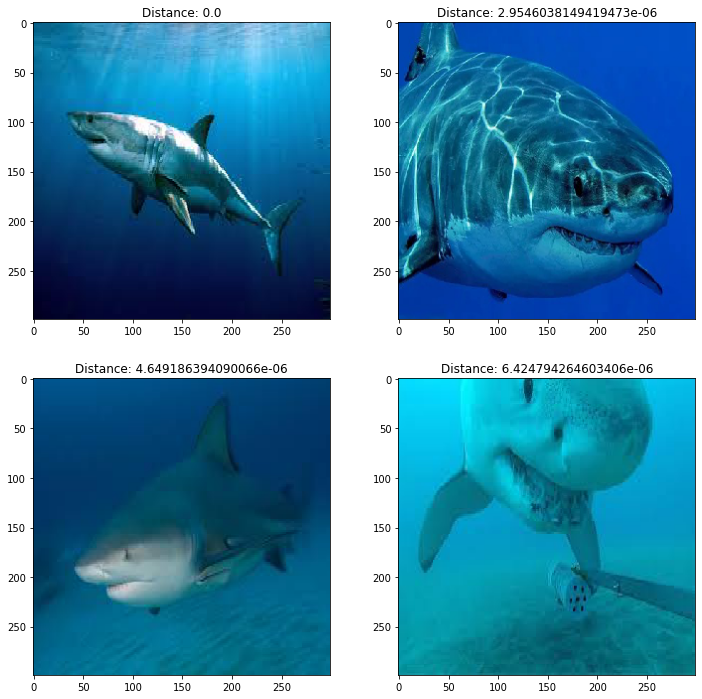

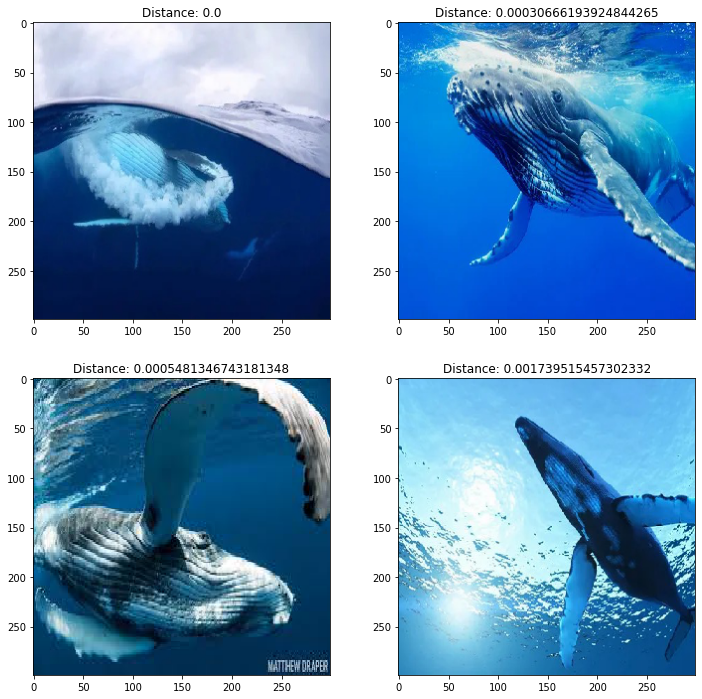

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 192 samples in 0.000s...
[t-SNE] Computed neighbors for 192 samples in 0.004s...
[t-SNE] Computed conditional probabilities for sample 192 / 192
[t-SNE] Mean sigma: 0.000110
[t-SNE] KL divergence after 250 iterations with early exaggeration: 50.898911
[t-SNE] KL divergence after 1000 iterations: 0.093430


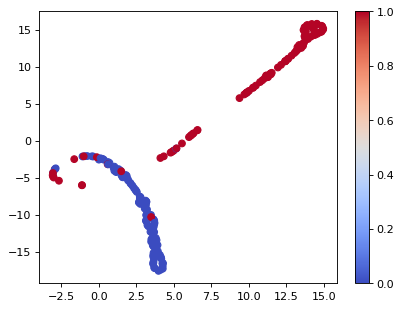

In [0]:
plot_feature_extraction(svw_model,
                        images,
                        labels,
                        n_images_to_plot=5
                        )